In [1]:
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import hvplot.pandas

In [51]:
path=Path(".\machine_temp_failure_missing.csv")

In [52]:
df_missing=pd.read_csv(path)
df_missing

,timestamp,value
0,02-12-2013 21:15,73.967322
1,02-12-2013 21:20,74.935882
2,02-12-2013 21:25,76.124162
3,02-12-2013 21:30,78.140707
4,02-12-2013 21:35,79.329836
...,...,...
22690,19-02-2014 15:05,98.185415
22691,19-02-2014 15:10,97.804168
22692,19-02-2014 15:15,97.135468
22693,19-02-2014 15:20,98.056852


In [50]:
df_missing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22695 entries, 0 to 22694
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  22695 non-null  object 
 1   value      21410 non-null  float64
dtypes: float64(1), object(1)
memory usage: 354.7+ KB


In [51]:
df_missing.isnull().sum()

timestamp       0
value        1285
dtype: int64

In [6]:
df_missing.describe()

,value
count,21410.000000
mean,85.968188
std,13.553070
min,2.084721
25%,83.082867
50%,89.251290
75%,93.910748
max,108.510543


In [53]:
df_missing= df_missing.rename(columns={'value':"temperature"})
df_missing

,timestamp,temperature
0,02-12-2013 21:15,73.967322
1,02-12-2013 21:20,74.935882
2,02-12-2013 21:25,76.124162
3,02-12-2013 21:30,78.140707
4,02-12-2013 21:35,79.329836
...,...,...
22690,19-02-2014 15:05,98.185415
22691,19-02-2014 15:10,97.804168
22692,19-02-2014 15:15,97.135468
22693,19-02-2014 15:20,98.056852


In [53]:
df_missing.temperature.isna().sum()

1285

In [54]:
df_missing.set_index("timestamp",inplace=True)
df_missing['delta_temperature']=df_missing['temperature'].diff()
df_missing

,temperature,delta_temperature
timestamp,,
02-12-2013 21:15,73.967322,NaN
02-12-2013 21:20,74.935882,0.968560
02-12-2013 21:25,76.124162,1.188280
02-12-2013 21:30,78.140707,2.016546
02-12-2013 21:35,79.329836,1.189128
...,...,...
19-02-2014 15:05,98.185415,NaN
19-02-2014 15:10,97.804168,-0.381246
19-02-2014 15:15,97.135468,-0.668700


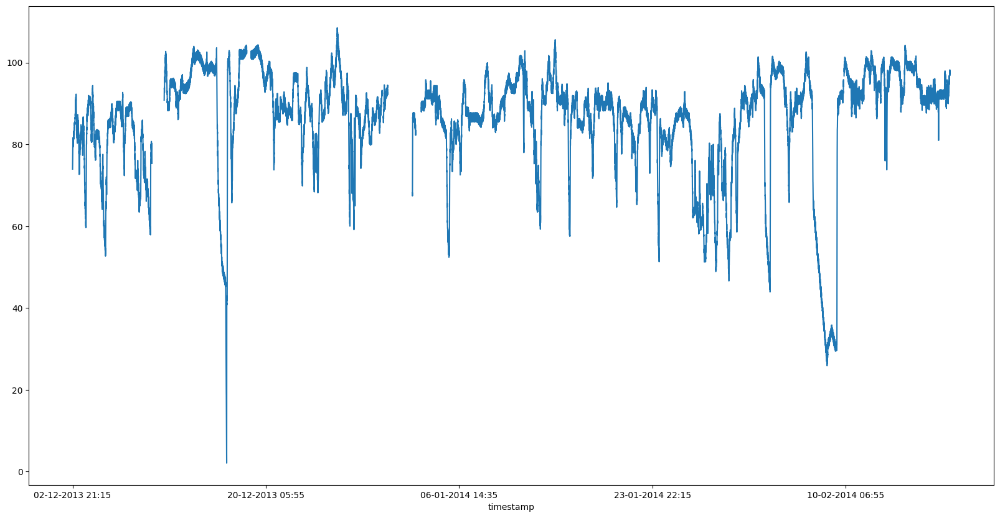

In [9]:
plt.figure(figsize=(20,10))

df_missing["temperature"].plot()
plt.show()

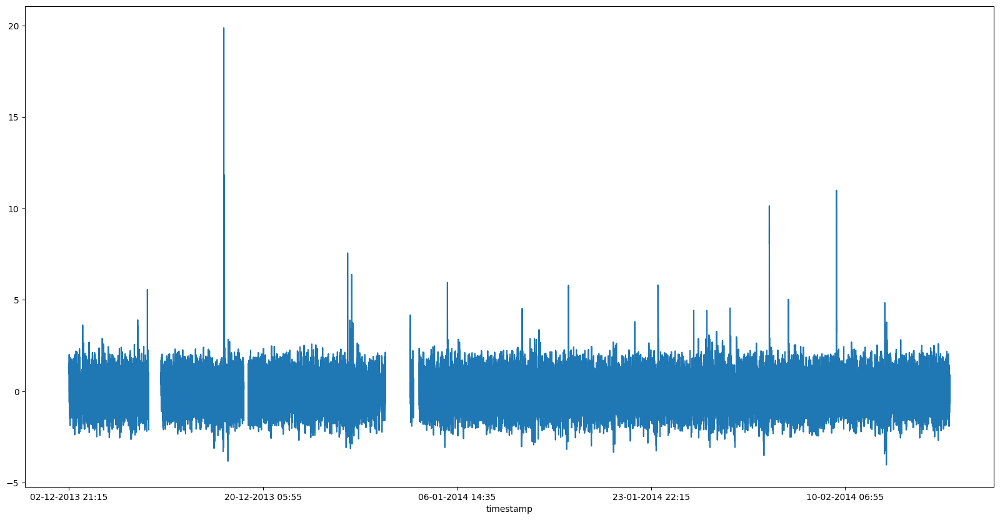

In [10]:
plt.figure(figsize=(20,10))
df_missing['delta_temperature'].plot()
plt.show()

In [11]:
df_missing['temperature'].hvplot(width=800, height=500) 

:Curve   [timestamp]   (temperature)

In [12]:
df_missing['delta_temperature'].hvplot()

:Curve   [timestamp]   (delta_temperature)

In [13]:
df_missing['temperature'].hvplot()

:Curve   [timestamp]   (temperature)

<Axes: xlabel='timestamp'>

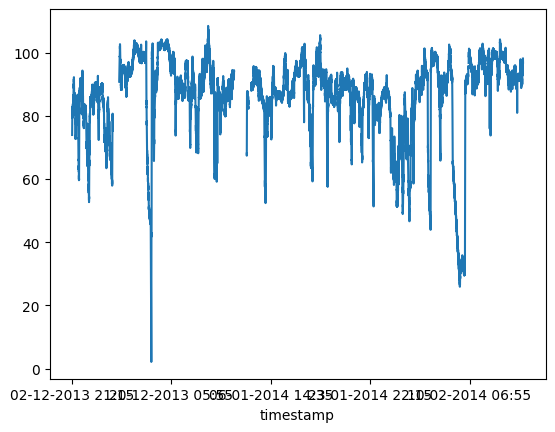

In [15]:
df_missing["temperature"].plot()

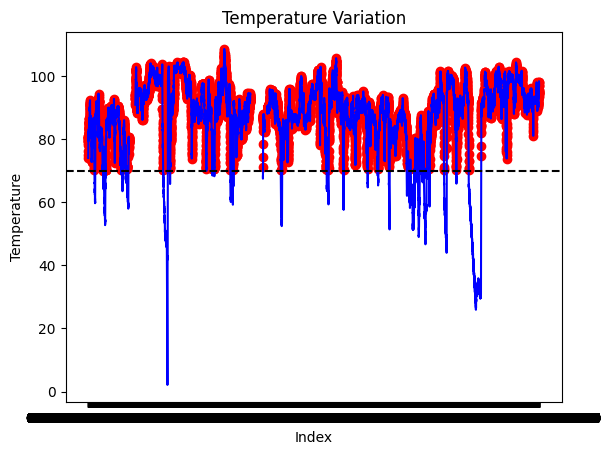

In [16]:
fig, ax = plt.subplots()

ax.plot(df_missing.index, df_missing["temperature"], color="blue")

ax.scatter(df_missing.index[df_missing["temperature"] > 70.00], df_missing["temperature"][df_missing["temperature"] > 70.00], color="red")

ax.axhline(y=70.00, color="black", linestyle="--")


ax.set_xlabel("Index")
ax.set_ylabel("Temperature")
ax.set_title("Temperature Variation")

# Display the plot
plt.show()


In [1]:
import pandas as pd
from pathlib import Path
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import sklearn
import statsmodels as sm

In [2]:
def read_dataset(folder, file, date_col=None):
    '''
    folder: is a Path object
    file: the CSV filename in that Path object. 
    date_col: specify a date_col to use as index_col 
    
    returns: a pandas DataFrame with a DatetimeIndex
    '''
    df = pd.read_csv(folder / file, 
                     index_col=date_col,sep="\t")
    return df


In [3]:
def plot_dfs(df1, df2, col, title=None, xlabel=None, ylabel=None):
    '''	
    df1: original dataframe without missing data
    df2: dataframe with missing data
    col: column name that contains missing data
    '''    
    df_missing = df2.rename(columns={col: 'missing'})
    
    columns = df_missing.loc[:, 'missing':].columns.tolist()
    subplots_size = len(columns)
    
    # subplots_size = df2.shape[1]
    fig, ax = plt.subplots(subplots_size+1, 1, sharex=True)
    plt.subplots_adjust(hspace=0.25)
    fig.suptitle = title 
    
    df1[col].plot(ax=ax[0], figsize=(10, 16))
    ax[0].set_title('Original Dataset')
    ax[0].set_xlabel(xlabel)
    ax[0].set_ylabel(ylabel)    
    
    for i, colname in enumerate(columns):
        df_missing[colname].plot(ax=ax[i+1])
        ax[i+1].set_title(colname)

    plt.show()

In [49]:
def rmse_score(df1, df2, col=None):
    '''
    df1: original dataframe without missing data
    df2: dataframe with missing data
    col: column name that contains missing data

    returns: a list of scores
    '''
    
    df1=df1.reset_index()
    df2=df2.reset_index()
    df_missing = df2.rename(columns={col: 'missing'})
    columns = df_missing.loc[:, 'missing':].columns.tolist()
    scores = []

    
    for comp_col in columns[1:]:
        # print(df1[col] - df_missing[comp_col])
        rmse = np.sqrt(np.mean((df1[col] - df_missing[comp_col])**2))
        scores.append(rmse)
        print(f'RMSE for {comp_col}: {rmse}')
    return scores


In [55]:
df_missing["ffillna"]=df_missing["temperature"].ffill()
df_missing.info()

<class 'pandas.core.frame.DataFrame'>
Index: 22695 entries, 02-12-2013 21:15 to 19-02-2014 15:25
Data columns (total 3 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   temperature        21410 non-null  float64
 1   delta_temperature  21380 non-null  float64
 2   ffillna            22695 non-null  float64
dtypes: float64(3)
memory usage: 709.2+ KB


In [56]:
df_missing['bfillna']=df_missing["temperature"].bfill()
df_missing.info()

<class 'pandas.core.frame.DataFrame'>
Index: 22695 entries, 02-12-2013 21:15 to 19-02-2014 15:25
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   temperature        21410 non-null  float64
 1   delta_temperature  21380 non-null  float64
 2   ffillna            22695 non-null  float64
 3   bfillna            22695 non-null  float64
dtypes: float64(4)
memory usage: 886.5+ KB


In [56]:
df_missing["mean"]=df_missing["temperature"].fillna(df_missing["temperature"].mean())
df_missing.info()

<class 'pandas.core.frame.DataFrame'>
Index: 22695 entries, 02-12-2013 21:15 to 19-02-2014 15:25
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   temperature        21410 non-null  float64
 1   delta_temperature  21380 non-null  float64
 2   ffillna            22695 non-null  float64
 3   mean               22695 non-null  float64
dtypes: float64(4)
memory usage: 886.5+ KB


In [57]:
df_missing.head()


,temperature,delta_temperature,ffillna,mean
timestamp,,,,
02-12-2013 21:15,73.967322,NaN,73.967322,73.967322
02-12-2013 21:20,74.935882,0.968560,74.935882,74.935882
02-12-2013 21:25,76.124162,1.188280,76.124162,76.124162
02-12-2013 21:30,78.140707,2.016546,78.140707,78.140707
02-12-2013 21:35,79.329836,1.189128,79.329836,79.329836


In [58]:
df_missing.info()

<class 'pandas.core.frame.DataFrame'>
Index: 22695 entries, 02-12-2013 21:15 to 19-02-2014 15:25
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   temperature        21410 non-null  float64
 1   delta_temperature  21380 non-null  float64
 2   ffillna            22695 non-null  float64
 3   mean               22695 non-null  float64
dtypes: float64(4)
memory usage: 886.5+ KB


In [61]:
df_missing=pd.read_csv(path,index_col='timestamp')
df_missing= df_missing.rename(columns={'value':"temperature"})

df_missing

,temperature
timestamp,
02-12-2013 21:15,73.967322
02-12-2013 21:20,74.935882
02-12-2013 21:25,76.124162
02-12-2013 21:30,78.140707
02-12-2013 21:35,79.329836
...,...
19-02-2014 15:05,98.185415
19-02-2014 15:10,97.804168
19-02-2014 15:15,97.135468


In [62]:
path1=Path(".\machine_temp_failure_original.csv")
df_original=pd.read_csv(path1,sep="\t",index_col='timestamp')
df_original= df_original.rename(columns={'value':"temperature"})

df_original

,temperature
timestamp,
12/2/2013 21:15,73.967322
12/2/2013 21:20,74.935882
12/2/2013 21:25,76.124162
12/2/2013 21:30,78.140707
12/2/2013 21:35,79.329836
...,...
2/19/2014 15:05,98.185415
2/19/2014 15:10,97.804168
2/19/2014 15:15,97.135468


In [63]:
df_missing["ffillna"]=df_missing["temperature"].ffill()
df_missing['bfillna']=df_missing["temperature"].bfill()
df_missing["mean"]=df_missing["temperature"].fillna(df_missing["temperature"].mean())
df_missing

,temperature,ffillna,bfillna,mean
timestamp,,,,
02-12-2013 21:15,73.967322,73.967322,73.967322,73.967322
02-12-2013 21:20,74.935882,74.935882,74.935882,74.935882
02-12-2013 21:25,76.124162,76.124162,76.124162,76.124162
02-12-2013 21:30,78.140707,78.140707,78.140707,78.140707
02-12-2013 21:35,79.329836,79.329836,79.329836,79.329836
...,...,...,...,...
19-02-2014 15:05,98.185415,98.185415,98.185415,98.185415
19-02-2014 15:10,97.804168,97.804168,97.804168,97.804168
19-02-2014 15:15,97.135468,97.135468,97.135468,97.135468


In [64]:
_ = rmse_score(df_original,
                    df_missing, 
                    'temperature')

RMSE for ffillna: 2.4939956524274454
RMSE for bfillna: 5.873128567455812
RMSE for mean: 3.961536496226712


In [66]:
path1=Path(".\machine_temp_failure_original.csv")
df_original=pd.read_csv(path1,sep="\t",index_col='timestamp')
df_original= df_original.rename(columns={'value':"temperature"})

df_original

,temperature
timestamp,
12/2/2013 21:15,73.967322
12/2/2013 21:20,74.935882
12/2/2013 21:25,76.124162
12/2/2013 21:30,78.140707
12/2/2013 21:35,79.329836
...,...
2/19/2014 15:05,98.185415
2/19/2014 15:10,97.804168
2/19/2014 15:15,97.135468


In [67]:
df_original['delta_temperature']=df_original['temperature'].diff()
df_original.info()

<class 'pandas.core.frame.DataFrame'>
Index: 22695 entries, 12/2/2013 21:15 to 2/19/2014 15:25
Data columns (total 2 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   temperature        22695 non-null  float64
 1   delta_temperature  22694 non-null  float64
dtypes: float64(2)
memory usage: 531.9+ KB


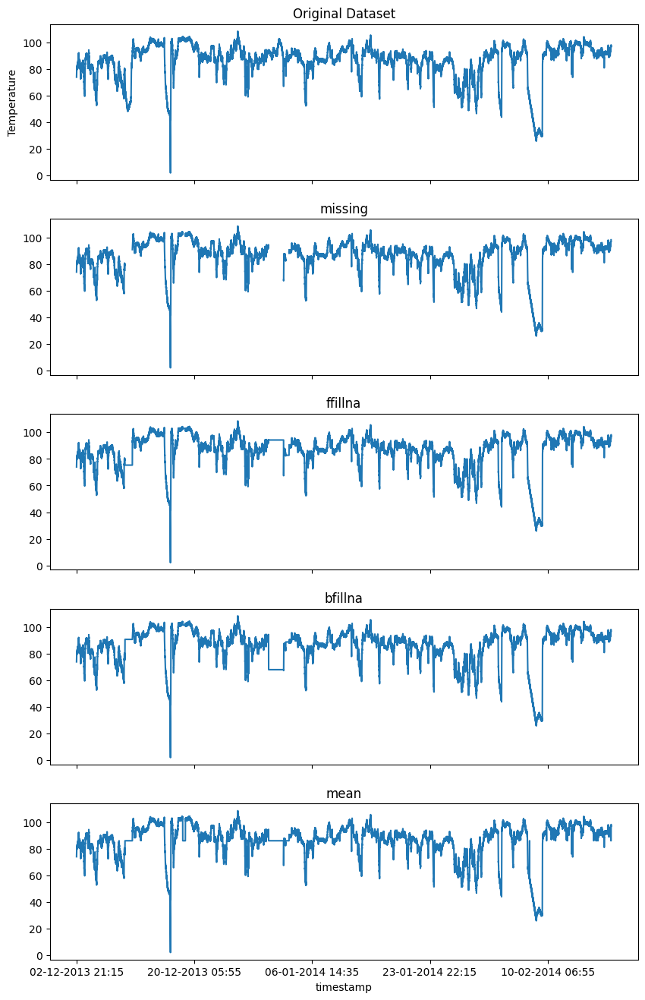

In [68]:
plot_dfs(df_original, 
         df_missing, 
         'temperature',
         title="Temperature variation with time",
         xlabel="timestamp",
         ylabel="Temperature")

In [69]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from sklearn.impute import SimpleImputer

In [70]:
path=Path(".\machine_temp_failure_missing.csv")
df_missing=pd.read_csv(path ,index_col='timestamp')
df_missing= df_missing.rename(columns={'value':"temperature"})

df_missing

,temperature
timestamp,
02-12-2013 21:15,73.967322
02-12-2013 21:20,74.935882
02-12-2013 21:25,76.124162
02-12-2013 21:30,78.140707
02-12-2013 21:35,79.329836
...,...
19-02-2014 15:05,98.185415
19-02-2014 15:10,97.804168
19-02-2014 15:15,97.135468


In [71]:
path1=Path(".\machine_temp_failure_original.csv")
df_original=pd.read_csv(path1,sep="\t",index_col='timestamp')
df_original= df_original.rename(columns={'value':"temperature"})

df_original

,temperature
timestamp,
12/2/2013 21:15,73.967322
12/2/2013 21:20,74.935882
12/2/2013 21:25,76.124162
12/2/2013 21:30,78.140707
12/2/2013 21:35,79.329836
...,...
2/19/2014 15:05,98.185415
2/19/2014 15:10,97.804168
2/19/2014 15:15,97.135468


In [72]:
strategy = [
    ('Mean Strategy', 'mean'),
    ('Median Strategy', 'median'),
    ('Most Frequent Strategy', 'most_frequent')]

In [73]:
df_vals = df_missing['temperature'].values.reshape(-1,1)
for s_name, s in strategy:
    df_missing[s_name] = (
        SimpleImputer(strategy=s).fit_transform(df_vals))

In [74]:
df_missing

,temperature,Mean Strategy,Median Strategy,Most Frequent Strategy
timestamp,,,,
02-12-2013 21:15,73.967322,73.967322,73.967322,73.967322
02-12-2013 21:20,74.935882,74.935882,74.935882,74.935882
02-12-2013 21:25,76.124162,76.124162,76.124162,76.124162
02-12-2013 21:30,78.140707,78.140707,78.140707,78.140707
02-12-2013 21:35,79.329836,79.329836,79.329836,79.329836
...,...,...,...,...
19-02-2014 15:05,98.185415,98.185415,98.185415,98.185415
19-02-2014 15:10,97.804168,97.804168,97.804168,97.804168
19-02-2014 15:15,97.135468,97.135468,97.135468,97.135468


In [75]:
_ = rmse_score(df_original, df_missing, 'temperature')

RMSE for Mean Strategy: 3.961536496226712
RMSE for Median Strategy: 4.071585793081295
RMSE for Most Frequent Strategy: 20.176855010139285


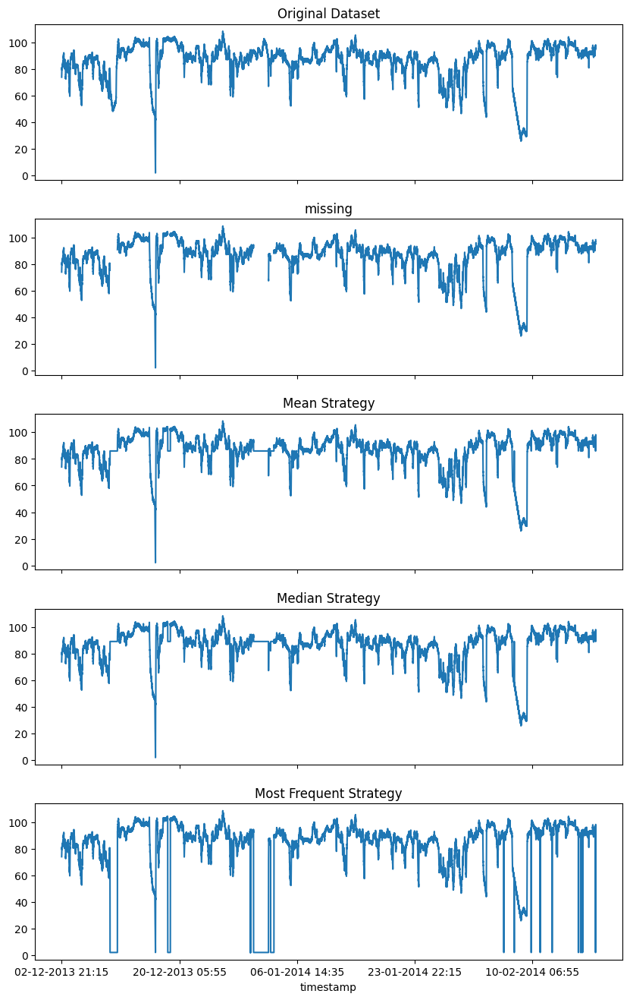

In [76]:
plot_dfs(df_original, df_missing, 'temperature')

In [77]:
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import ExtraTreesRegressor, BaggingRegressor
from sklearn.linear_model import ElasticNet, LinearRegression, BayesianRidge
from sklearn.neighbors import KNeighborsRegressor

In [351]:
path=Path(".\machine_temp_failure_missing.csv")
df_missing=pd.read_csv(path)
df_missing['timestamp'] = pd.to_datetime(df_missing['timestamp'],format= "mixed")
df_missing= df_missing.rename(columns={'value':"temperature"})
df_missing.set_index(df_missing['timestamp'],inplace=True)
del df_missing['timestamp']
df_missing

,temperature
timestamp,
2013-02-12 21:15:00,73.967322
2013-02-12 21:20:00,74.935882
2013-02-12 21:25:00,76.124162
2013-02-12 21:30:00,78.140707
2013-02-12 21:35:00,79.329836
...,...
2014-02-19 15:05:00,98.185415
2014-02-19 15:10:00,97.804168
2014-02-19 15:15:00,97.135468


In [352]:
path1=Path(".\machine_temp_failure_original.csv")
df_original=pd.read_csv(path1,sep="\t")

df_original['timestamp'] = pd.to_datetime(df_original['timestamp'],format= "mixed")
df_original= df_original.rename(columns={'value':"temperature"})
df_original.set_index(df_original['timestamp'],inplace=True)
del df_original['timestamp']
df_original

,temperature
timestamp,
2013-12-02 21:15:00,73.967322
2013-12-02 21:20:00,74.935882
2013-12-02 21:25:00,76.124162
2013-12-02 21:30:00,78.140707
2013-12-02 21:35:00,79.329836
...,...
2014-02-19 15:05:00,98.185415
2014-02-19 15:10:00,97.804168
2014-02-19 15:15:00,97.135468


In [353]:
estimators = [
    ('bayesianRidge', BayesianRidge()),
    ('extra_trees', ExtraTreesRegressor(n_estimators=10)),
    ('bagging', BaggingRegressor(n_estimators=10)),
    ('elastic_net', ElasticNet()),
    ('linear_regression', LinearRegression()),
    ('knn', KNeighborsRegressor(n_neighbors=3))
]

In [354]:
df_missing.iloc[:,0:1].info()


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 22695 entries, 2013-02-12 21:15:00 to 2014-02-19 15:25:00
Data columns (total 1 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   temperature  21410 non-null  float64
dtypes: float64(1)
memory usage: 354.6 KB


In [364]:
df_vals = df_missing.iloc[:,0:1].values.reshape(-1,1)
print(df_vals.shape)
print(len(df_vals))
for e_name, e in estimators:
    est = IterativeImputer(
                random_state=10,
                estimator=e).fit(df_vals)
    df_missing[e_name] = est.transform(df_vals)[: , 0]
    

(22695, 1)
22695


In [359]:
df_missing

,temperature,bayesianRidge,extra_trees,bagging,elastic_net,linear_regression,knn
timestamp,,,,,,,
2013-02-12 21:15:00,73.967322,73.967322,73.967322,73.967322,73.967322,73.967322,73.967322
2013-02-12 21:20:00,74.935882,74.935882,74.935882,74.935882,74.935882,74.935882,74.935882
2013-02-12 21:25:00,76.124162,76.124162,76.124162,76.124162,76.124162,76.124162,76.124162
2013-02-12 21:30:00,78.140707,78.140707,78.140707,78.140707,78.140707,78.140707,78.140707
2013-02-12 21:35:00,79.329836,79.329836,79.329836,79.329836,79.329836,79.329836,79.329836
...,...,...,...,...,...,...,...
2014-02-19 15:05:00,98.185415,98.185415,98.185415,98.185415,98.185415,98.185415,98.185415
2014-02-19 15:10:00,97.804168,97.804168,97.804168,97.804168,97.804168,97.804168,97.804168
2014-02-19 15:15:00,97.135468,97.135468,97.135468,97.135468,97.135468,97.135468,97.135468


In [365]:
_ = rmse_score(df_original, df_missing, 'temperature')

RMSE for bayesianRidge: 3.961536496226712
RMSE for extra_trees: 3.961536496226712
RMSE for bagging: 3.961536496226712
RMSE for elastic_net: 3.961536496226712
RMSE for linear_regression: 3.961536496226712
RMSE for knn: 3.961536496226712


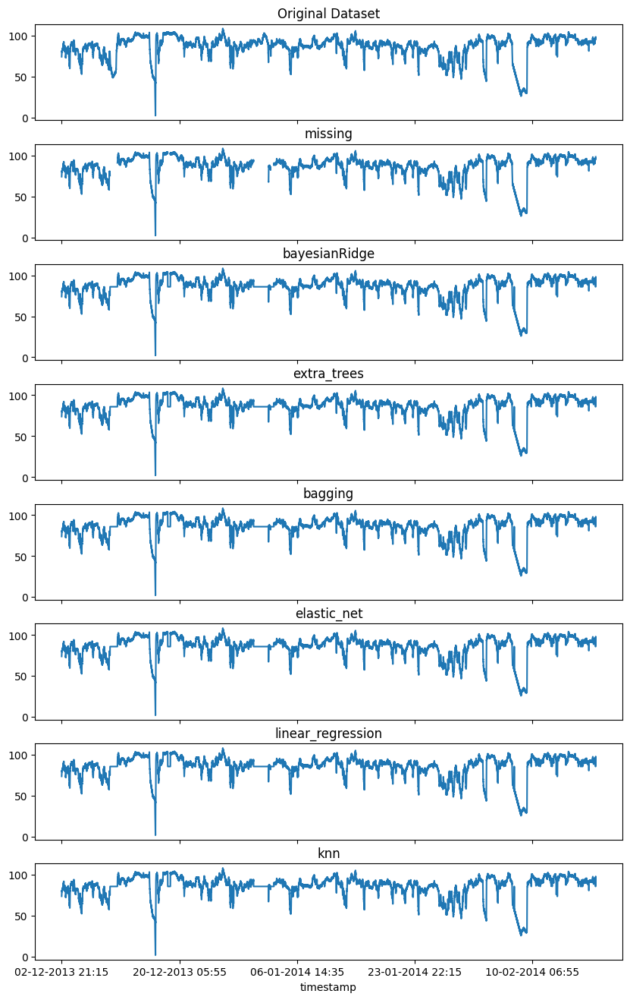

In [317]:
plot_dfs(df_original, df_missing, 'temperature')

In [390]:
path=Path(".\machine_temp_failure_missing.csv")
df_missing=pd.read_csv(path)
df_missing['timestamp'] = pd.to_datetime(df_missing['timestamp'],format= "mixed")
df_missing= df_missing.rename(columns={'value':"temperature"})
df_missing.set_index(df_missing['timestamp'],inplace=True)
del df_missing['timestamp']

df_missing["ffill"] = df_missing['temperature'].ffill()

df_missing

,temperature,ffill
timestamp,,
2013-02-12 21:15:00,73.967322,73.967322
2013-02-12 21:20:00,74.935882,74.935882
2013-02-12 21:25:00,76.124162,76.124162
2013-02-12 21:30:00,78.140707,78.140707
2013-02-12 21:35:00,79.329836,79.329836
...,...,...
2014-02-19 15:05:00,98.185415,98.185415
2014-02-19 15:10:00,97.804168,97.804168
2014-02-19 15:15:00,97.135468,97.135468


In [392]:
del df_missing['temperature']

In [393]:
df_missing.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 22695 entries, 2013-02-12 21:15:00 to 2014-02-19 15:25:00
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ffill   22695 non-null  float64
dtypes: float64(1)
memory usage: 354.6 KB


In [385]:
df_missing.index



DatetimeIndex(['2013-02-12 21:15:00', '2013-02-12 21:20:00',
               '2013-02-12 21:25:00', '2013-02-12 21:30:00',
               '2013-02-12 21:35:00', '2013-02-12 21:40:00',
               '2013-02-12 21:45:00', '2013-02-12 21:50:00',
               '2013-02-12 21:55:00', '2013-02-12 22:00:00',
               ...
               '2014-02-19 14:40:00', '2014-02-19 14:45:00',
               '2014-02-19 14:50:00', '2014-02-19 14:55:00',
               '2014-02-19 15:00:00', '2014-02-19 15:05:00',
               '2014-02-19 15:10:00', '2014-02-19 15:15:00',
               '2014-02-19 15:20:00', '2014-02-19 15:25:00'],
              dtype='datetime64[ns]', name='timestamp', length=22695, freq=None)

<Axes: xlabel='timestamp'>

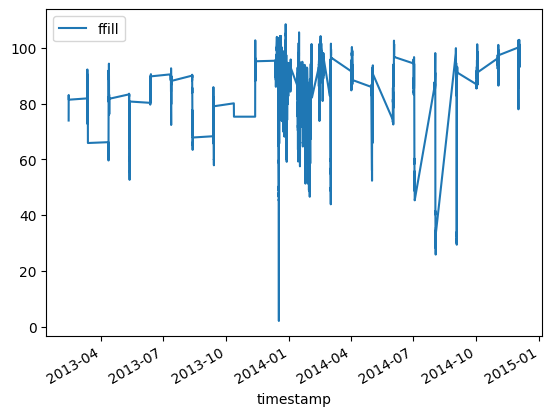

In [386]:
df_missing.plot()

In [394]:
df_missing = df_missing.resample('H').mean()


In [396]:
df_missing.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 15795 entries, 2013-02-12 21:00:00 to 2014-12-02 23:00:00
Freq: H
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ffill   1891 non-null   float64
dtypes: float64(1)
memory usage: 246.8 KB


<Axes: xlabel='ffill'>

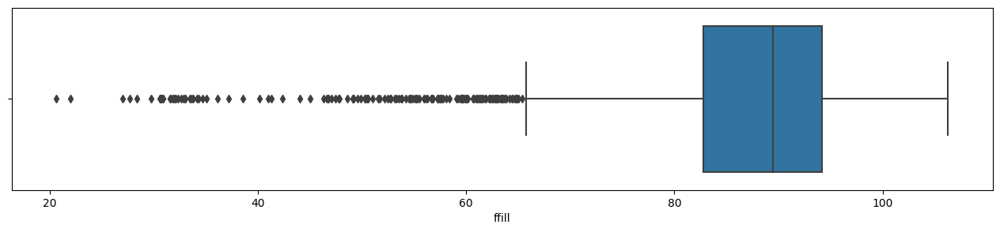

In [401]:
import seaborn as sns
plt.rcParams["figure.figsize"] = 16, 3
sns.boxplot(x=df_missing['ffill'], whis=1.5)

<Axes: xlabel='ffill'>

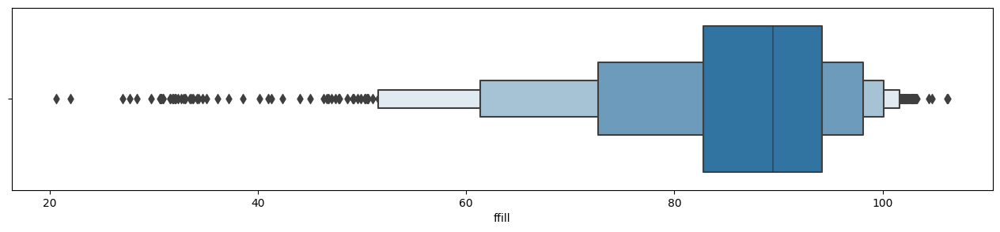

In [403]:
sns.boxenplot(x=df_missing['ffill'],k_depth=4)

In [404]:
from pandas.plotting import lag_plot


<Axes: xlabel='y(t)', ylabel='y(t + 1)'>

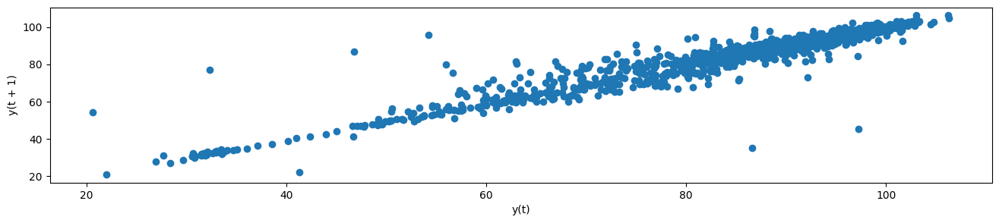

In [405]:
lag_plot(df_missing, lag=1)

<Axes: >

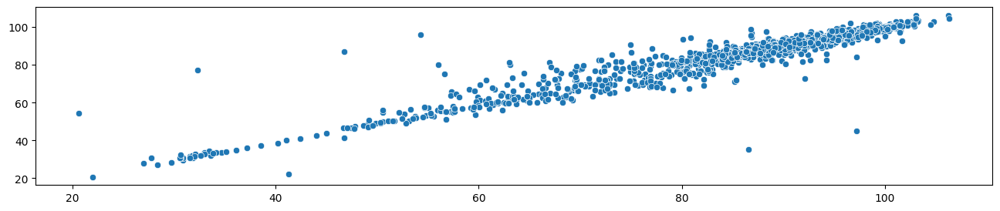

In [406]:
y = df_missing[1:].values.reshape(-1)
x = df_missing[:-1].values.reshape(-1)
sns.scatterplot(x=x, y=y)

In [411]:
def iqr_outliers(data):
    q1, q3 = np.percentile(data, [25, 75])
    IQR = q3 - q1
    lower_fence = q1 - (1.5 * IQR)
    upper_fence = q3 + (1.5 * IQR)
    return data[(data['ffill'] > upper_fence) | (data['ffill'] < lower_fence)]

In [412]:
outliers = iqr_outliers(df_missing)
print(outliers)

Empty DataFrame
Columns: [ffill]
Index: []
